In [52]:
using DifferentialEquations
using ModelingToolkit
using LinearAlgebra
using Plots
using Colors
using Images
using Statistics
using Sundials
using Random
using JLD2
using DSP

Using 4 species instead of 2 and an explicit time delay allows for using faster solver and does not require nearly as much memory to run.

Added diffusion for pak that is a 2X faster than rhoT to prevent chasing, where rhoT creates waves, and because makes sense for a more peripheral protein.

Oscillation and equalization observed.

With same concentration of total Rho as simpilist with scaling model, this produces more polarity patches (as parameterized).
Reducing concentration reduces patch number.

In [190]:
function setup(r)
    # Generate constants
    N = 100
    SA = 4*pi*r^2
    V = (4/3)*pi*r^3
    mem_thickness = 0.01
    n = (mem_thickness * SA) / V

    Ax = Array(Tridiagonal([1.0 for i in 1:N-1],[-2.0 for i in 1:N],[1.0 for i in 1:N-1]))
    Ax[1,end] = 1.0
    Ax[end,1] = 1.0
    dx = (r*sqrt(pi))/N
    Ax = Ax/(dx^2) # adjust for 1/microns
    Ay = copy(Ax)

    r0 = zeros(100,100,6)
    r0[:,:,1] .= 5 .*(rand.())   # Cdc42-GTPm
    #r0[50,50,1] = 500
    r0[:,:,2] .= 0.5 - mean(r0[:,:,1])*n   # Cdc42-GDPm should be 0.5
    r0[:,:,3] .= 1
    r0[:,:,4] .= 10 .*(rand.())
    r0[:,:,5] .= 1
    r0[:,:,6] .= 0.75
    
    # Dummy parameters used only locally in fxn but passed to specify scope, or something..
    Ayt = zeros(N,N)
    tAx = zeros(N,N)
    D42t = zeros(N,N)
    D42d = zeros(N,N)
    Dpak = zeros(N,N)
    Dgef = zeros(N,N)
    Dpakc = zeros(N,N)
    Dgefc = zeros(N,N)
    R = zeros(N,N)
    dummy = (Ayt, tAx, D42t, D42d, Dpak, Dgef, Dpakc, Dgefc, R)
    # Actual parameters
    a = .8
    b = .07
    c = 1
    d = .03 
    e = .04 
    f = .05 
    g = .025 
    Dm = .01
    Dc = 10
    Dm2 = .1
    n = n

    p = [a, b, c, d, e, f, g, Dm, Dc, Dm2, n, Ax, Ay, dummy]
    return p, r0
end

setup (generic function with 1 method)

In [191]:
function simple!(dr,r,p,t)
    a, b, c, d, e, f, g, Dm, Dc, Dm2, n, Ax, Ay, dummy = p
    Ayt, tAx, D42t, D42d, Dpak, Dgef, Dpakc, Dgefc, R = dummy
    # Window variables
    rhoT = @view r[:,:,1]
    rhoD = @view r[:,:,2]
    pak = @view r[:,:,3]
    gef = @view r[:,:,4]
    pakc = @view r[:,:,5]
    gefc = @view r[:,:,6]
    # Calculate diffusion
    mul!(Ayt,Ay,rhoT)
    mul!(tAx,rhoT,Ax)
    @. D42t = Dm*(Ayt + tAx)
    mul!(Ayt,Ay,rhoD)
    mul!(tAx,rhoD,Ax)
    @. D42d = Dc*(Ayt + tAx)
    mul!(Ayt,Ay,pak)
    mul!(tAx,pak,Ax)
    @. Dpak = Dm2*(Ayt + tAx)
    mul!(Ayt,Ay,gef)
    mul!(tAx,gef,Ax)
    @. Dgef = Dm*(Ayt + tAx)
    mul!(Ayt,Ay,pakc)
    mul!(tAx,pakc,Ax)
    @. Dpakc = Dc*(Ayt + tAx)
    mul!(Ayt,Ay,gefc)
    mul!(tAx,gefc,Ax)
    @. Dgefc = Dc*(Ayt + tAx)
    # Calculate reactions, add diffusion
    @. R = (a*gef^2*rhoD) - b*rhoT
    @. dr[:,:,1] = R + D42t
    @. dr[:,:,2] = -R*n + D42d
    @. dr[:,:,3] = d*rhoT*pakc - e*pak + Dpak
    @. dr[:,:,4] = f*rhoT*gefc - g*pak*gef + Dgef 
    @. dr[:,:,5] = n*(- d*rhoT*pakc + e*pak) + Dpakc
    @. dr[:,:,6] = n*(- f*rhoT*gefc + g*pak*gef) + Dgefc
end


simple! (generic function with 1 method)

In [196]:
function run_pde(radius)
    p, r0 = setup(radius)
    min_prob = ODEProblem(simple!,r0,(0.0,1800),p)
    sol_simp = solve(min_prob,CVODE_BDF(linear_solver = :GMRES),saveat=1)
    return sol_simp
end

run_pde (generic function with 1 method)

In [197]:
Random.seed!(1)
sol3 = run_pde(3)

retcode: Success
Interpolation: 1st order linear
t: 1801-element Vector{Float64}:
    0.0
    1.0
    2.0
    3.0
    4.0
    5.0
    6.0
    7.0
    8.0
    9.0
    ⋮
 1792.0
 1793.0
 1794.0
 1795.0
 1796.0
 1797.0
 1798.0
 1799.0
 1800.0
u: 1801-element Vector{Array{Float64, 3}}:
 [0.36683177234646425 0.835264546438933 … 2.249147211554762 2.173323933861879; 1.7462074477859306 3.5986034627025916 … 4.042108624872047 4.622203430755562; … ; 4.169267240766527 1.8065761920519257 … 1.647577563964819 2.9521148392176446; 4.908521739743653 1.8093785356895964 … 1.5532595482954692 1.13008217989294;;; 0.4749735434055491 0.4749735434055491 … 0.4749735434055491 0.4749735434055491; 0.4749735434055491 0.4749735434055491 … 0.4749735434055491 0.4749735434055491; … ; 0.4749735434055491 0.4749735434055491 … 0.4749735434055491 0.4749735434055491; 0.4749735434055491 0.4749735434055491 … 0.4749735434055491 0.4749735434055491;;; 1.0 1.0 … 1.0 1.0; 1.0 1.0 … 1.0 1.0; … ; 1.0 1.0 … 1.0 1.0; 1.0 1.0 … 1.0 1.0;;

┌ Info: Saved animation to /tmp/jl_78BU18DQZ2.gif
└ @ Plots /home/dinosaur/.julia/packages/Plots/HyyIK/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_78BU18DQZ2.gif")
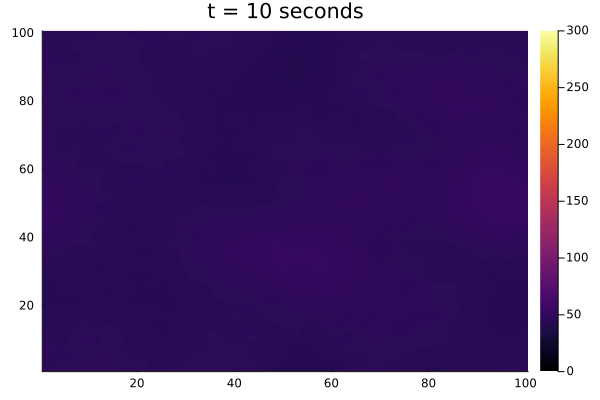

In [198]:
anim = @animate for i in 1:90
    Plots.heatmap(sol3[:,:,1,i*10], clim=(0,300), title="t = $(i*10) seconds")
end
gif(anim, fps=5)
#gif(anim, "tmp_negFB_r5.gif", fps=60)

94.21732264458045

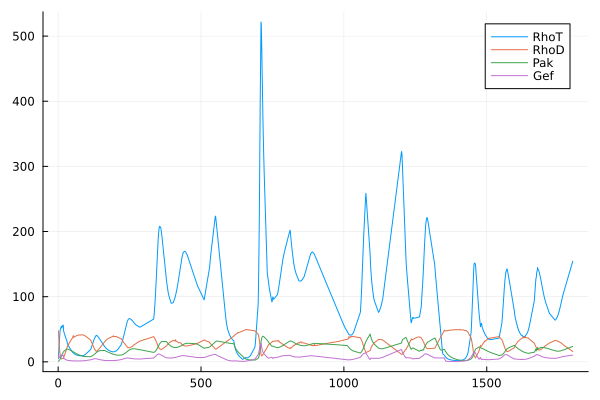

In [199]:
r=3
SA = 4*pi*r^2
V = (4/3)*pi*r^3
mem_thickness = 0.01
n = (mem_thickness * SA) / V

T = dropdims(maximum(sol3[:,:,1,:], dims=(1,2)), dims = (1,2))[1:1:end]
D = dropdims(maximum(sol3[:,:,2,:], dims=(1,2)), dims = (1,2))./n
P = dropdims(maximum(sol3[:,:,3,:], dims=(1,2)), dims = (1,2))
G = dropdims(maximum(sol3[:,:,4,:], dims=(1,2)), dims = (1,2))
print(mean(T))
plot(T, label="RhoT")
plot!(D, label="RhoD")
plot!(P, label="Pak")
plot!(G, label="Gef")
#plot!(T+D)
#plot!(D, label="RhoD")


In [209]:
Random.rand(10)

10-element Vector{Float64}:
 0.29171523971855395
 0.189555299736761
 0.8516593326131331
 0.06022721877040238
 0.44737588766860703
 0.1829135516269701
 0.6927912782457261
 0.6848101164766774
 0.640396254158808
 0.3323996575340009

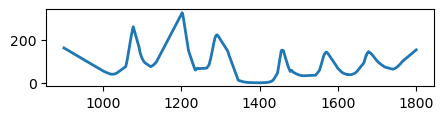

In [213]:
using PythonPlot
fig, ax = PythonPlot.subplots(figsize=(5,1))
ax.plot(900:1800, T[900:1800], linewidth=2, color="C0")
display(gcf())

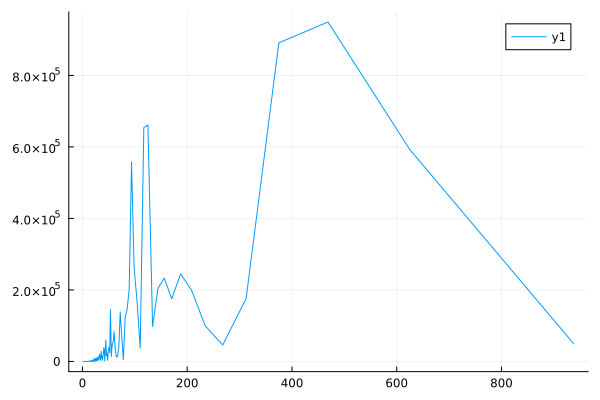

In [200]:
pdg = DSP.Periodograms.periodogram(T)
plot(1 ./ pdg.freq[3:end], pdg.power[3:end])

In [ ]:
# From sweeps found more regular oscillation by 
# 1. lowering total Pak conc
# 2. lowering parameter 2
# 3. lowering parameter 1. This means both rhoT dynamics slowing overall. 

1

In [201]:
p, r0 = setup(3)
for i in range(1,10)
    Random.seed!(1)
    p, r0 = setup(3)
    p[i] = p[i]*1.25
    min_prob = ODEProblem(simple!,r0,(0.0,900),p)
    sol = solve(min_prob,CVODE_BDF(linear_solver = :GMRES),saveat=5)
    T = dropdims(maximum(sol[:,:,1,:], dims=(1,2)), dims = (1,2))
    P = dropdims(maximum(sol3[:,:,3,:], dims=(1,2)), dims = (1,2))
    G = dropdims(maximum(sol3[:,:,4,:], dims=(1,2)), dims = (1,2))
    nmax = length(findlocalmaxima(sol[:,:,1,end], edges=false))
    plot(T)
    plot!(G)
    plot!(P)
    savefig("../negsims/sim_p$(i)_1p25_$(nmax)patch.png")
    Random.seed!(1)
    p, r0 = setup(3)
    p[i] = p[i]*0.8
    min_prob = ODEProblem(simple!,r0,(0.0,900),p)
    sol = solve(min_prob,CVODE_BDF(linear_solver = :GMRES),saveat=5)
    T = dropdims(maximum(sol[:,:,1,:], dims=(1,2)), dims = (1,2))
    P = dropdims(maximum(sol3[:,:,3,:], dims=(1,2)), dims = (1,2))
    G = dropdims(maximum(sol3[:,:,4,:], dims=(1,2)), dims = (1,2))
    nmax = length(findlocalmaxima(sol[:,:,1,end], edges=false))
    plot(T)
    plot!(G)
    plot!(P)
    savefig("../negsims/sim_p$(i)_0p8_$(nmax)patch.png")
end

InterruptException: InterruptException:

In [98]:
i

UndefVarError: UndefVarError: `i` not defined

In [110]:
p, r0 = setup(3)
for i in (2,5,6)
    i = Int(i)
    Random.seed!(1)
    p, r0 = setup(3)
    r0[:,:,i] .= r0[:,:,i] .* 1.5
    min_prob = ODEProblem(simple!,r0,(0.0,900),p)
    sol = solve(min_prob,CVODE_BDF(linear_solver = :GMRES),saveat=5)
    T = dropdims(maximum(sol[:,:,1,:], dims=(1,2)), dims = (1,2))
    nmax = length(findlocalmaxima(sol[:,:,1,end], edges=false))
    plot(T)
    savefig("../negsims/sim_u0_$(i)_1p5_$(nmax)patch.png")
    Random.seed!(1)
    p, r0 = setup(3)
    r0[:,:,i] .= r0[:,:,i] .* 0.75
    min_prob = ODEProblem(simple!,r0,(0.0,900),p)
    sol = solve(min_prob,CVODE_BDF(linear_solver = :GMRES),saveat=5)
    T = dropdims(maximum(sol[:,:,1,:], dims=(1,2)), dims = (1,2))
    nmax = length(findlocalmaxima(sol[:,:,1,end], edges=false))
    plot(T)
    savefig("../negsims/sim_u0_$(i)_0p75_$(nmax)patch.png")
end

In [ ]:
for i in (2,5,6)
    print(i)
end

r0[:,:,2] .= 0.5 - mean(r0[:,:,1])*n   # Cdc42-GDPm should be 0.5
r0[:,:,3] .= 1
r0[:,:,4] .= 10 .*(rand.())
r0[:,:,5] .= 1
r0[:,:,6] .= 1

123

In [168]:
Random.seed!(2)
sol = run_pde(3)

retcode: Success
Interpolation: 1st order linear
t: 901-element Vector{Float64}:
   0.0
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
   ⋮
 892.0
 893.0
 894.0
 895.0
 896.0
 897.0
 898.0
 899.0
 900.0
u: 901-element Vector{Array{Float64, 3}}:
 [0.011252934448812701 0.10801893569454935 … 4.8337323176179305 1.7190875596857524; 3.403737532443592 3.4158588928393896 … 0.3223460636361314 3.6922294451921474; … ; 3.7416055062092415 0.9052508432922046 … 4.377487076330552 2.4502849065995376; 3.300173485091389 4.738012777748101 … 3.10709535745295 0.13187683679847018;;; 0.4747765629569831 0.4747765629569831 … 0.4747765629569831 0.4747765629569831; 0.4747765629569831 0.4747765629569831 … 0.4747765629569831 0.4747765629569831; … ; 0.4747765629569831 0.4747765629569831 … 0.4747765629569831 0.4747765629569831; 0.4747765629569831 0.4747765629569831 … 0.4747765629569831 0.4747765629569831;;; 1.0 1.0 … 1.0 1.0; 1.0 1.0 … 1.0 1.0; … ; 1.0 1.0 … 1.0 1.0; 1.0 1.0 … 1.0 1.0;;; 8.29966304582

100.34116987335885

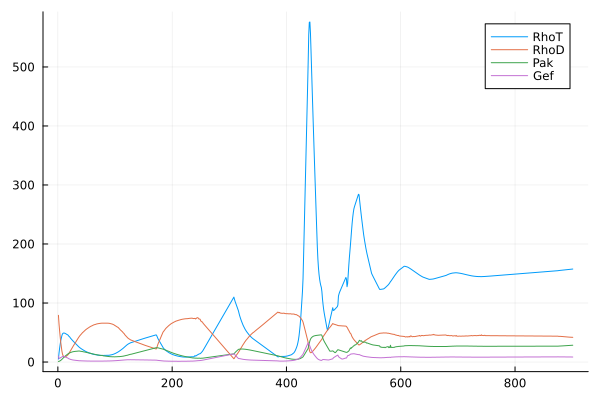

In [169]:
r=5
SA = 4*pi*r^2
V = (4/3)*pi*r^3
mem_thickness = 0.01
n = (mem_thickness * SA) / V

T = dropdims(maximum(sol[:,:,1,:], dims=(1,2)), dims = (1,2))
D = dropdims(maximum(sol[:,:,2,:], dims=(1,2)), dims = (1,2))./n
P = dropdims(maximum(sol[:,:,3,:], dims=(1,2)), dims = (1,2))
G = dropdims(maximum(sol[:,:,4,:], dims=(1,2)), dims = (1,2))
print(mean(T))
plot(T, label="RhoT")
plot!(D, label="RhoD")
plot!(P, label="Pak")
plot!(G, label="Gef")
#plot!(T+D)
#plot!(D, label="RhoD")


┌ Info: Saved animation to /tmp/jl_7s3O5Yfarg.gif
└ @ Plots /home/dinosaur/.julia/packages/Plots/HyyIK/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_7s3O5Yfarg.gif")
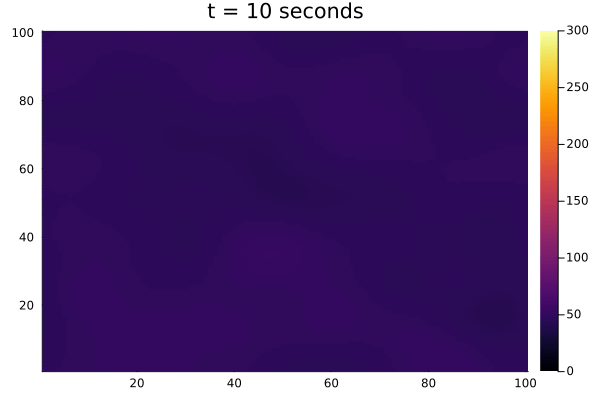

In [62]:
anim = @animate for i in 1:180
    Plots.heatmap(sol[:,:,1,i*10], clim=(0,300), title="t = $(i*10) seconds")
end
gif(anim, fps=5)
#gif(anim, "tmp_negFB_r5.gif", fps=60)

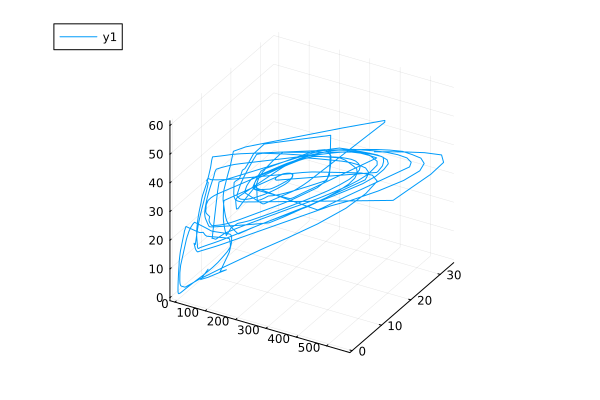

In [65]:
plot(T,G,P)

In [170]:
Random.seed!(1)
sol6 = run_pde(6)

retcode: Success
Interpolation: 1st order linear
t: 901-element Vector{Float64}:
   0.0
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
   ⋮
 892.0
 893.0
 894.0
 895.0
 896.0
 897.0
 898.0
 899.0
 900.0
u: 901-element Vector{Array{Float64, 3}}:
 [0.36683177234646425 0.835264546438933 … 2.249147211554762 2.173323933861879; 1.7462074477859306 3.5986034627025916 … 4.042108624872047 4.622203430755562; … ; 4.169267240766527 1.8065761920519257 … 1.647577563964819 2.9521148392176446; 4.908521739743653 1.8093785356895964 … 1.5532595482954692 1.13008217989294;;; 0.48748677170277455 0.48748677170277455 … 0.48748677170277455 0.48748677170277455; 0.48748677170277455 0.48748677170277455 … 0.48748677170277455 0.48748677170277455; … ; 0.48748677170277455 0.48748677170277455 … 0.48748677170277455 0.48748677170277455; 0.48748677170277455 0.48748677170277455 … 0.48748677170277455 0.48748677170277455;;; 1.0 1.0 … 1.0 1.0; 1.0 1.0 … 1.0 1.0; … ; 1.0 1.0 … 1.0 1.0; 1.0 1.0 … 1.0 1.0;;; 4.01

199.18673519882384

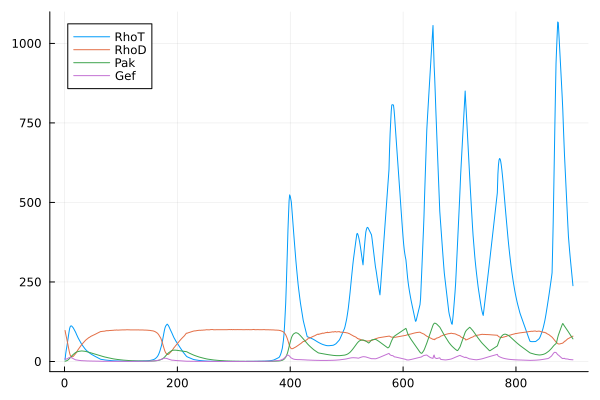

In [171]:
r=6
SA = 4*pi*r^2
V = (4/3)*pi*r^3
mem_thickness = 0.01
n = (mem_thickness * SA) / V

T = dropdims(maximum(sol6[:,:,1,:], dims=(1,2)), dims = (1,2))
D = dropdims(maximum(sol6[:,:,2,:], dims=(1,2)), dims = (1,2))./n
P = dropdims(maximum(sol6[:,:,3,:], dims=(1,2)), dims = (1,2))
G = dropdims(maximum(sol6[:,:,4,:], dims=(1,2)), dims = (1,2))
print(mean(T))
plot(T, label="RhoT")
plot!(D, label="RhoD")
plot!(P, label="Pak")
plot!(G, label="Gef")

┌ Info: Saved animation to /tmp/jl_dQJEvKFslQ.gif
└ @ Plots /home/dinosaur/.julia/packages/Plots/HyyIK/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_dQJEvKFslQ.gif")
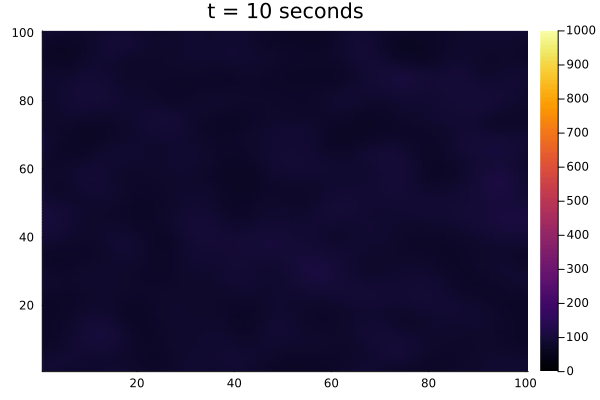

In [172]:
anim = @animate for i in 1:90
    Plots.heatmap(sol6[:,:,1,i*10], clim=(0,1000), title="t = $(i*10) seconds")
end
gif(anim, fps=5)

In [215]:
Random.seed!(1)
sol6 = run_pde(9)

retcode: Success
Interpolation: 1st order linear
t: 1801-element Vector{Float64}:
    0.0
    1.0
    2.0
    3.0
    4.0
    5.0
    6.0
    7.0
    8.0
    9.0
    ⋮
 1792.0
 1793.0
 1794.0
 1795.0
 1796.0
 1797.0
 1798.0
 1799.0
 1800.0
u: 1801-element Vector{Array{Float64, 3}}:
 [0.36683177234646425 0.835264546438933 … 2.249147211554762 2.173323933861879; 1.7462074477859306 3.5986034627025916 … 4.042108624872047 4.622203430755562; … ; 4.169267240766527 1.8065761920519257 … 1.647577563964819 2.9521148392176446; 4.908521739743653 1.8093785356895964 … 1.5532595482954692 1.13008217989294;;; 0.4916578478018497 0.4916578478018497 … 0.4916578478018497 0.4916578478018497; 0.4916578478018497 0.4916578478018497 … 0.4916578478018497 0.4916578478018497; … ; 0.4916578478018497 0.4916578478018497 … 0.4916578478018497 0.4916578478018497; 0.4916578478018497 0.4916578478018497 … 0.4916578478018497 0.4916578478018497;;; 1.0 1.0 … 1.0 1.0; 1.0 1.0 … 1.0 1.0; … ; 1.0 1.0 … 1.0 1.0; 1.0 1.0 … 1.0 1.0;;